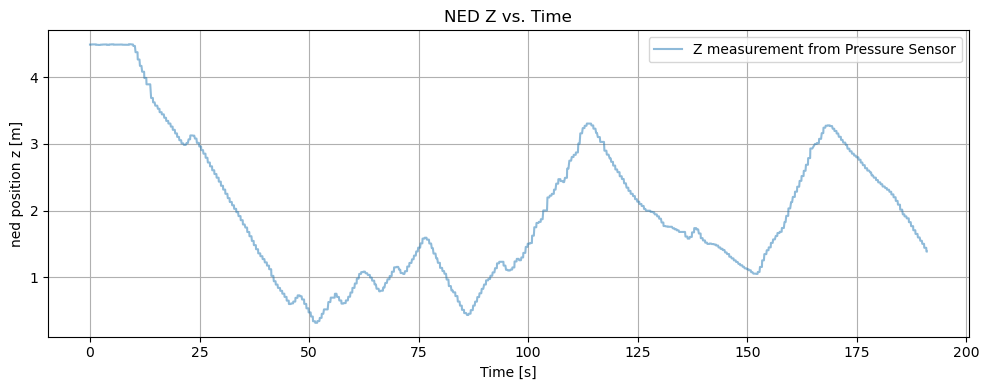

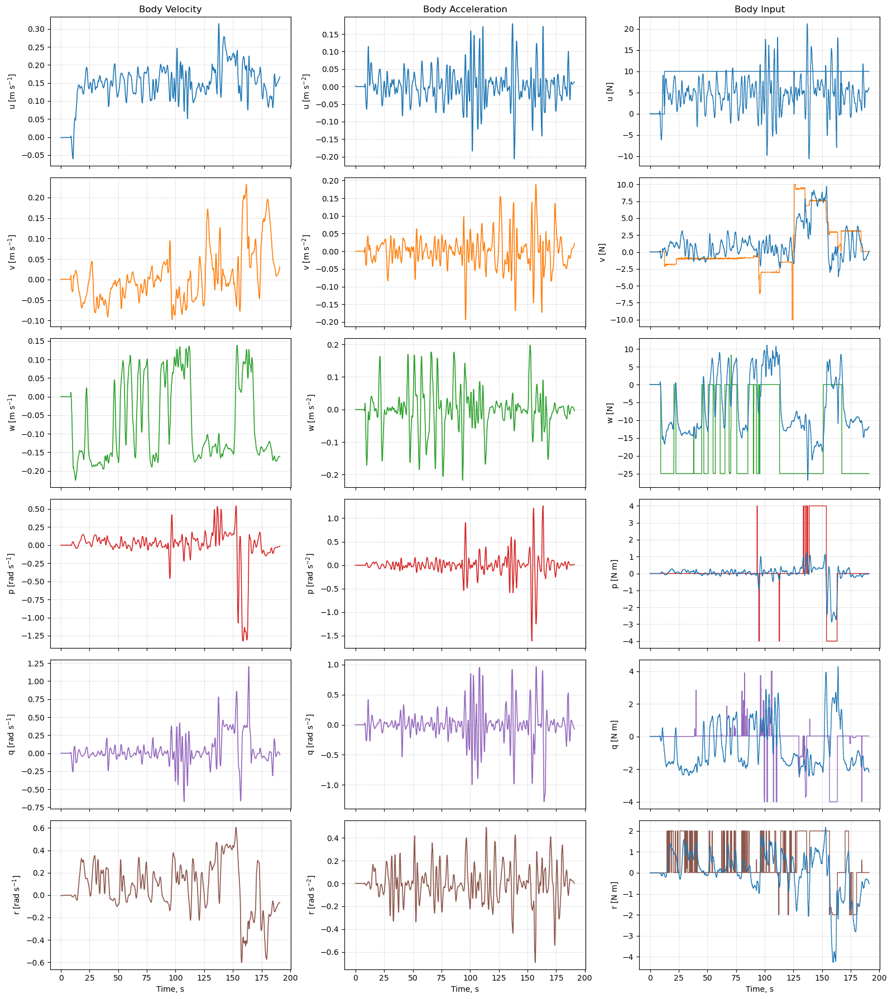

0.1733277769999404
0.15151105399991138
0.14994401599960838
[[ True  True  True  True  True  True]
 [ True  True  True  True  True  True]
 [ True  True  True  True  True  True]
 [ True  True  True  True  True  True]
 [ True  True  True  True  True  True]
 [ True  True  True  True  True  True]]
True


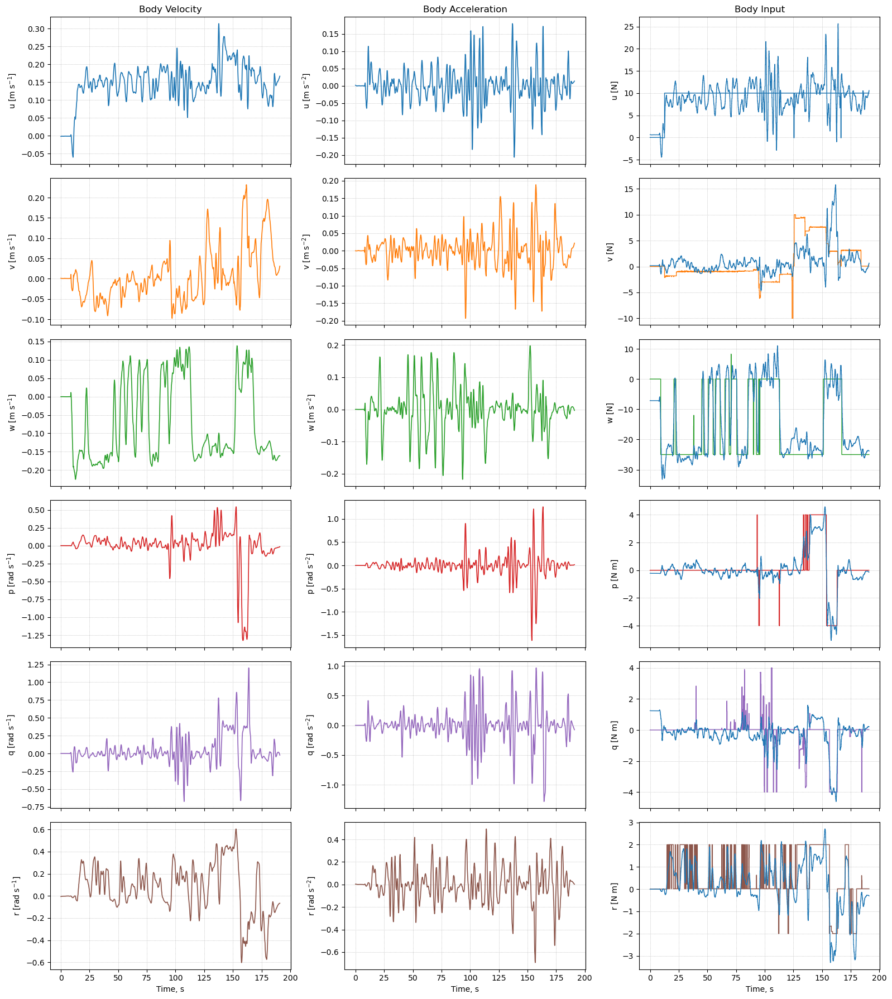


Identified vehicle parameters, UVMS base
----------------------------------------------------

Effective translational inertia terms, linear velocity axes:
  surge, m - X_du: 37.2029
  sway,  m - Y_dv: 22.1828
  heave, m - Z_dw: 66.1735

Effective rotational inertia terms, angular velocity axes:
  roll,  I_x - K_dp: 1.39646
  pitch, I_y - M_dq: 0.498032
  yaw,   I_z - N_dr: 2.53119

Restoring terms:
  weight W [N]: 105
  buoyancy B [N]: 97.8296
  net, B - W [N]: -7.17035
  x_g W - x_b B [N m]: 0.82748
  y_g W - y_b B [N m]: 0.136823
  z_g W - z_b B [N m]: 4.25841
  ||[x_g W - x_b B, y_g W - y_b B, z_g W - z_b B]||: 4.34022

Linear drag coefficients:
  X_u [N s m^-1]: -73.6417
  Y_v [N s m^-1]: -33.6082
  Z_w [N s m^-1]: -89.4055
  K_p [N m s rad^-1]: -2.98736
  M_q [N m s rad^-1]: -1.57922
  N_r [N m s rad^-1]: -3.39766

Quadratic drag coefficients:
  X_uu [N s^2 m^-2]: -0.000147912
  Y_vv [N s^2 m^-2]: -0.000516373
  Z_ww [N s^2 m^-2]: -98.5523
  K_pp [N m s^2 rad^-2]: -0.0305908
  M

In [1]:
%run dynamic_parameter_identification.ipynb

In [2]:
def M_from_uv_np(beta):
    m_X_du   = beta[0]
    m_Y_dv   = beta[1]
    m_Z_dw   = beta[2]
    mz_g_X_dq = beta[3]
    mz_g_Y_dp = beta[4]
    mz_g_K_dv = beta[5]
    mz_g_M_du = beta[6]
    I_x_K_dp  = beta[7]
    I_y_M_dq  = beta[8]
    I_z_N_dr  = beta[9]

    M = np.array([
        [m_X_du,   0.0,      0.0,      0.0,        mz_g_X_dq, 0.0],
        [0.0,      m_Y_dv,   0.0,      mz_g_Y_dp,  0.0,       0.0],
        [0.0,      0.0,      m_Z_dw,   0.0,        0.0,       0.0],
        [0.0,      mz_g_K_dv, 0.0,     I_x_K_dp,   0.0,       0.0],
        [mz_g_M_du, 0.0,     0.0,      0.0,        I_y_M_dq,  0.0],
        [0.0,      0.0,      0.0,      0.0,        0.0,       I_z_N_dr],
    ])
    return M

In [3]:

def log_likelihood(theta, A, b):
    """
    Homoscedastic Gaussian likelihood
    theta = [beta_0, ..., beta_{p-1}, log_sigma]
    A shape (n, p)
    b shape (n,)
    """
    if not np.all(np.isfinite(theta)):
        return -np.inf

    n, p = A.shape
    beta = theta[:p]
    log_sigma = theta[p]

    model = A @ beta
    if not np.all(np.isfinite(model)):
        return -np.inf

    sigma2 = np.exp(2.0 * log_sigma)
    if not np.isfinite(sigma2) or sigma2 <= 0.0:
        return -np.inf

    resid = b - model
    term = resid**2 / sigma2 + np.log(sigma2)
    if not np.all(np.isfinite(term)):
        return -np.inf

    return -0.5 * np.sum(term)


In [4]:
def log_prior(theta, estimator, W0, B0):
    """
    Structured Gaussian prior with constraints.
    Uses group specific scales.
    """
    if not np.all(np.isfinite(theta)):
        return -np.inf

    p = estimator.p
    beta = theta[:p]
    log_sigma = theta[p]

    if np.any(beta < -1e5) or np.any(beta > 1e5):
        return -np.inf

    # unpack groups
    idx_inertia = estimator.idx_inertia
    idx_WB = estimator.idx_WB
    idx_moment = estimator.idx_moment
    idx_linear = estimator.idx_linear
    idx_quad = estimator.idx_quad

    inertia = beta[idx_inertia]
    WB = beta[idx_WB]
    moment = beta[idx_moment]
    linear = beta[idx_linear]
    quad = beta[idx_quad]

    W = WB[0]
    B = WB[1]

    # hard constraints
    if not (estimator.W_min <= W <= estimator.W_max):
        return -np.inf

    if np.any(linear > 0.0):
        return -np.inf
    if np.any(quad > 0.0):
        return -np.inf

    # SPD check on inertia block
    M = M_from_uv_np(beta)
    if not np.all(np.isfinite(M)):
        return -np.inf
    try:
        eigvals = np.linalg.eigvalsh(0.5 * (M + M.T))
    except np.linalg.LinAlgError:
        return -np.inf
    if np.any(eigvals <= 1e-6):
        return -np.inf

    # noise prior
    if not (-10.0 < log_sigma < 3.0):
        return -np.inf

    # group scales
    s_inertia = 50.0
    s_WB = 10.0
    s_moment = 5.0
    s_linear = 20.0
    s_quad = 0.5

    lp_inertia = -0.5 * np.sum((inertia / s_inertia)**2)
    lp_WB_centered = -0.5 * ((W - W0) / 5.0)**2 - 0.5 * ((B - B0) / 5.0)**2
    lp_moment = -0.5 * np.sum((moment / s_moment)**2)
    lp_linear = -0.5 * np.sum((linear / s_linear)**2)
    lp_quad = -0.5 * np.sum((quad / s_quad)**2)
    lp_sigma = -0.5 * (log_sigma / 3.0)**2

    return lp_inertia + lp_WB_centered + lp_moment + lp_linear + lp_quad + lp_sigma

In [5]:
def log_probability(theta, estimator, A, b, W0, B0):
    try:
        lp = log_prior(theta, estimator, W0, B0)
        if not np.isfinite(lp):
            return -np.inf
        ll = log_likelihood(theta, A, b)
        if not np.isfinite(ll):
            return -np.inf
        return lp + ll
    except Exception:
        return -np.inf

In [6]:
def build_initial_walkers(theta0, nwalkers, log_prob_fn, logprob_args,
                          jitter_scale=1e-3, max_tries=100000):
    ndim = len(theta0)
    initial = np.zeros((nwalkers, ndim))
    vals = np.full(nwalkers, -np.inf)
    count = 0
    tries = 0

    while count < nwalkers and tries < max_tries:
        cand = theta0 + jitter_scale * np.random.randn(ndim)
        lp = log_prob_fn(cand, *logprob_args)
        if np.isfinite(lp):
            initial[count] = cand
            vals[count] = lp
            count += 1
        tries += 1

    if count < nwalkers:
        raise RuntimeError(f"Only {count} finite walkers out of {nwalkers}")
    return initial, vals

In [7]:
def run_mcmc_for_vehicle(estimator, Y_big, tau_big,
                         W0=105.0, B0=98.0,
                         nwalkers=None, nsteps=100000):
    """
    Phase 1: convex estimate
    Phase 2: MCMC around that estimate with structured prior
    """
    # convex phase
    beta_map, v, w, solve_time = estimator.estimate_vehicle_physical_parameters(
        Y_big, tau_big, warm_start=True
    )

    p = beta_map.size
    # rough initial noise guess from residuals
    resid = tau_big - Y_big @ beta_map
    sigma0 = np.std(resid) + 1e-8
    log_sigma0 = np.log(sigma0)

    theta0 = np.concatenate([beta_map, [log_sigma0]])
    ndim = p + 1

    if nwalkers is None:
        nwalkers = max(2 * ndim, 64)

    logprob_args = (estimator, Y_big, tau_big, W0, B0)

    initial, vals = build_initial_walkers(
        theta0, nwalkers, log_probability, logprob_args,
        jitter_scale=1e-3
    )
    print("Initial finite logp:", np.isfinite(vals).sum(), "/", nwalkers)

    sampler = emcee.EnsembleSampler(
        nwalkers, ndim, log_probability, args=logprob_args
    )

    sampler.run_mcmc(initial, nsteps, progress=True)
    return sampler, beta_map

In [8]:
import emcee
import os

nsteps=200000
filename = f"dory_mcmc_results_{nsteps}.npz"

if os.path.exists(filename):
    print("Loading cached MCMC results...")
    data = np.load(filename)
    samples = data["samples"]
    flat_samples = data["flat_samples"]
    beta_map = data["beta_map"]

else:
    print("Running MCMC. This will take a while...")
    sampler, beta_map = run_mcmc_for_vehicle(
        estimator,
        Y_big,
        τ_big,
        W0=105.0,
        B0=98.0,
        nsteps=nsteps,
    )

    samples = sampler.get_chain()
    flat_samples = sampler.get_chain(discard=1000, thin=20, flat=True)

    np.savez_compressed(
        filename,
        samples=samples,
        flat_samples=flat_samples,
        beta_map=beta_map,
        W0=105.0,
        B0=98.0,
        discard=1000,
        thin=20,
    )
    print("Saved MCMC results to", filename)

print("samples shape:", samples.shape)
print("flat_samples shape:", flat_samples.shape)
print("beta_map shape:", beta_map.shape)


Loading cached MCMC results...
samples shape: (200000, 64, 28)
flat_samples shape: (636800, 28)
beta_map shape: (27,)


         name         opt                   post_ci
0      m_X_du   37.202855           40.5 [36, 39.3]
1      m_Y_dv   22.182807         23.2 [21.3, 25.1]
2      m_Z_dw   66.173481         68.9 [65.5, 73.7]
3   mz_g_X_dq    3.389098          3.44 [3.3, 3.91]
4   mz_g_Y_dp    0.641362        1.27 [0.442, 1.25]
5   mz_g_K_dv    0.641362      -0.951 [-5.34, 5.15]
6   mz_g_M_du    3.389098       0.146 [0.441, 3.06]
7    I_x_K_dp    1.396464         1.62 [0.53, 4.02]
8    I_y_M_dq    0.498032        1.23 [0.548, 1.25]
9    I_z_N_dr    2.531187          2.81 [2.2, 3.02]
10          W  105.000000            109 [106, 112]
11          B   97.829645           102 [98.4, 105]
12  x_gW_x_bB    0.827480        0.785 [0.7, 0.914]
13  y_gW_y_bB    0.136823     0.175 [0.0717, 0.216]
14  z_gW_z_bB    4.258412         4.29 [3.97, 4.57]
15        X_u  -73.641667      -73.9 [-74.6, -73.6]
16        Y_v  -33.608211      -39.7 [-44.5, -32.7]
17        Z_w  -89.405511         -101 [-104, -103]
18        K_

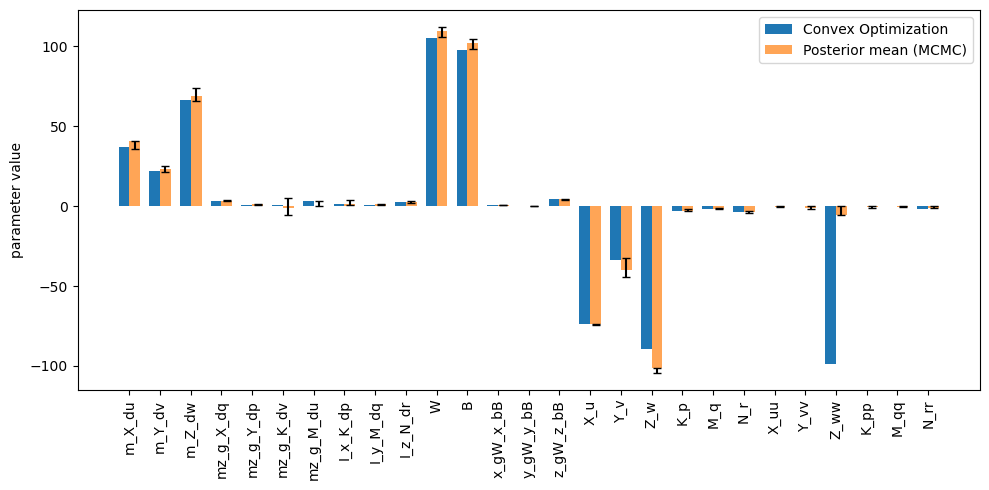

In [10]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. Basic stats
p = beta_map.size          # 27
beta_samples = flat_samples[:, :p]

names = [
    "m_X_du", "m_Y_dv", "m_Z_dw",
    "mz_g_X_dq", "mz_g_Y_dp", "mz_g_K_dv", "mz_g_M_du",
    "I_x_K_dp", "I_y_M_dq", "I_z_N_dr",
    "W", "B",
    "x_gW_x_bB", "y_gW_y_bB", "z_gW_z_bB",
    "X_u", "Y_v", "Z_w", "K_p", "M_q", "N_r",
    "X_uu", "Y_vv", "Z_ww", "K_pp", "M_qq", "N_rr",
]
assert len(names) == p

beta_mean = np.mean(beta_samples, axis=0)
beta_q16, beta_q84 = np.percentile(beta_samples, [16, 84], axis=0)

# 2. DataFrame with CI strings
df = pd.DataFrame({
    "name": names,
    "opt": beta_map,
    "post_mean": beta_mean,
    "post_q16": beta_q16,
    "post_q84": beta_q84,
})

df["post_ci"] = df.apply(
    lambda row: f"{row['post_mean']:.3g} [{row['post_q16']:.3g}, {row['post_q84']:.3g}]",
    axis=1,
)

print(df[["name", "opt", "post_ci"]])

# 3. Plot optimization vs posterior mean with error bars
indices = np.arange(p)
width = 0.35

fig, ax = plt.subplots(figsize=(10, 5))

ax.bar(indices - width/2, beta_map, width, label="Convex Optimization")
ax.bar(indices + width/2, beta_mean, width, label="Posterior mean (MCMC)", alpha=0.7)

# asymmetric error bars (non negative)
lower_err = np.maximum(beta_mean - beta_q16, 0.0)
upper_err = np.maximum(beta_q84 - beta_mean, 0.0)
yerr = np.vstack([lower_err, upper_err])

print("min lower_err:", lower_err.min())
print("min upper_err:", upper_err.min())

ax.errorbar(
    indices + width/2,
    beta_mean,
    yerr=yerr,
    fmt="none",
    ecolor="black",
    capsize=3,
)

ax.set_xticks(indices)
ax.set_xticklabels(names, rotation=90)
ax.set_ylabel("parameter value")
ax.legend()
fig.tight_layout()
plt.show()


```markdown
The results show that the data provides strong information about the dominant physical dynamics of the vehicle. Inertial parameters, weight, buoyancy, and the primary linear damping terms exhibit tight posterior distributions and remain close to the optimisation values, indicating that these components are well excited and reliably estimated from the available trajectories. Cross coupling terms and restoring moment components display wider posteriors with noticeable correlations, reflecting weaker excitation of those modes and therefore reduced identifiability. The quadratic damping parameters show the broadest uncertainty, consistent with the fact that higher order hydrodynamic effects require sustained high speed motion to be observable. Among these, the parameter `Z_ww` is especially weakly constrained, with the posterior collapsing toward small negative values far from the optimisation estimate. This pattern indicates that vertical quadratic drag is not strongly expressed in the data and that the model can satisfy the observed forces without relying on a large `Z_ww` term. Overall, the posterior landscape highlights a clear separation between well identified low order dynamics and higher order hydrodynamic coefficients that remain uncertain due to limited excitation.
```


In [11]:
def draw_posterior_samples(N=1000, seed=None):
    if seed is not None:
        np.random.seed(seed)                      # makes sampling repeatable

    idx = np.random.randint(flat_samples.shape[0], size=N)
    betas = flat_samples[idx, :p]                 # keep first p parameters (27)
    print("Drawn betas shape:", betas.shape)

    padding = np.zeros((betas.shape[0], 6))        # append 6 additional zeros
    return np.concatenate([betas, padding], axis=1)   # (N, 33)


posterior_samples = draw_posterior_samples(80000, 42)  # 80000 draws
print(posterior_samples.shape)  # (80000, 33)
print(posterior_samples[0, :])

posterior_samples.astype(np.float64).tofile("posterior_dory.bin")

Drawn betas shape: (80000, 27)
(80000, 33)
[  37.87510082   31.04277402   70.47201707    3.43189089    1.71824982
    6.49748579    3.53156337    4.31305611    0.6655363     2.84481698
  110.90927127  103.75030161    0.8902485     0.12841847    4.95336712
  -74.55251679  -37.04542376 -104.60552065   -1.18157201   -1.60127476
   -1.99178071   -0.60802397   -2.73122864   -0.80243211   -1.98431858
   -0.63853431   -4.52635655    0.            0.            0.
    0.            0.            0.        ]


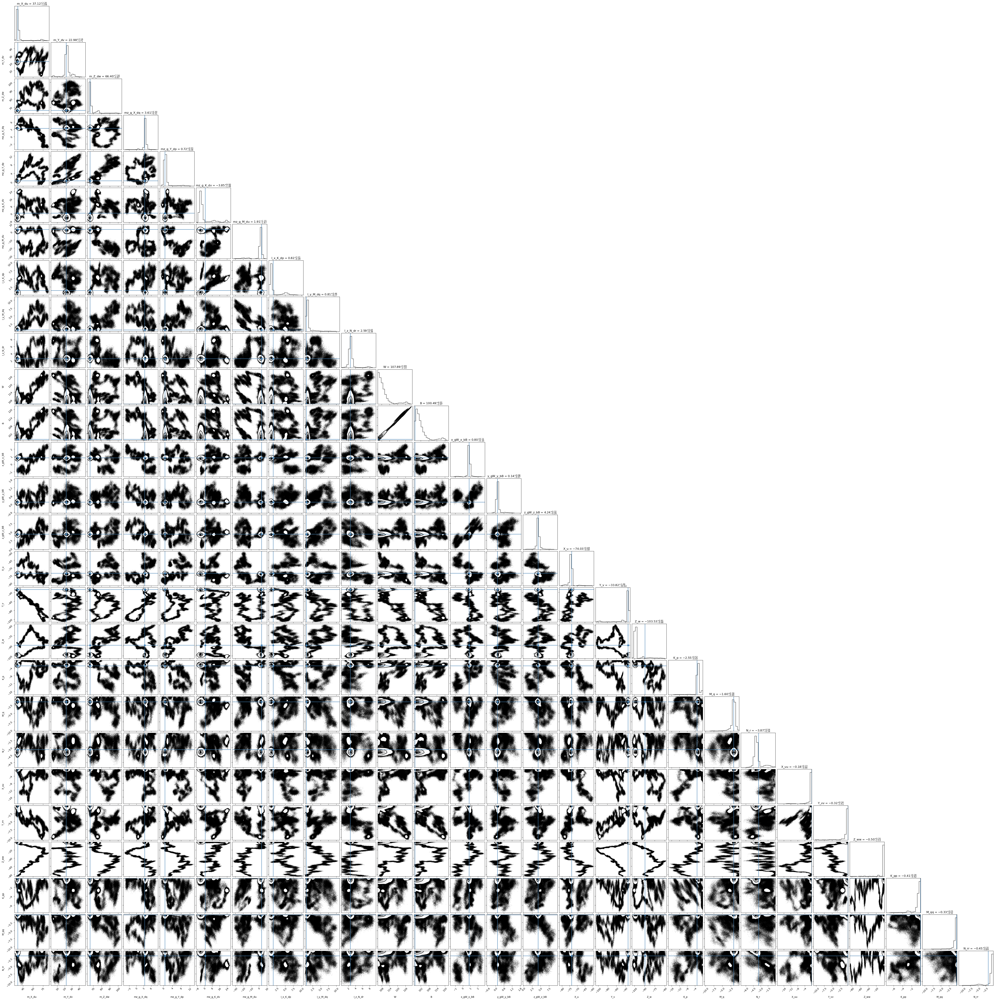

In [12]:
import corner

# choose a few indices to visualize
corner_idx = list(range(p))
corner_labels = [names[i] for i in corner_idx]

corner_samples = beta_samples[:, corner_idx]
truths = beta_map[corner_idx]

fig = corner.corner(
    corner_samples,
    labels=corner_labels,
    truths=truths,
    show_titles=True,
    quiet=True
)